In [7]:
from math import ceil
from typing import Dict, Any
import os
import sys

import librosa as la

module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)
from speech_audio_semantic_search.speech2text.config import get_config
from speech_audio_semantic_search.speech2text.model import SpeechToText
from speech_audio_semantic_search.speech2text.utils import batch_data, print_plot_play

In [8]:

audio_file_path = "../sound_clips/prigozihn_dna_identification_reportage.mp3"
filename = audio_file_path.split("/")[-1].split(".")[0]
transcript_outpath = f"../ßtranscripts/{filename}_transcript.txt"

In [9]:
def audio_transcript(
    audio_file_path: str,
    frames_batch_size: int = 10,
    frame_seconds: int = 30,
    overlap: float = 1,
) -> Dict[str, Any]:
    asr_model = SpeechToText(f"../{get_config().whisper_path}")
    audio, sr = la.load(audio_file_path)

    sr_resampled = 16000
    audio_resampled = la.resample(audio, orig_sr=sr, target_sr=sr_resampled)

    # Calculate the frame size and frame overlap
    frame_size = int(sr_resampled * frame_seconds)
    if overlap == 0:
        hop_length = frame_size
    elif overlap < 1:
        hop_length = int(frame_size * (1 - overlap))
    else:
        raise Exception("Overlap must be float ranging in (0, 1)")

    # Break the audio into frames
    audio_frames = la.util.frame(
        audio_resampled, frame_length=frame_size, hop_length=hop_length
    ).transpose()

    batches = batch_data(audio_frames, frames_batch_size)

    transcript_windows = []
    audio_windows = []
    start_end = []
    for i, batch in enumerate(batches):
        for j in range(batch.shape[0]):
            frame_start = (
                (i * frames_batch_size + j)
                * frame_size
                * (1 - overlap)
                / sr_resampled
            )
            frame_end = frame_start + frame_size / sr_resampled
            start_end.append((frame_start, frame_end))
        audio_windows.extend([frame for frame in batch])
        transcript_windows.extend(
            asr_model.generate_transcript(
                asr_model.featurize_audio_batch(batch, sr_resampled)
            )
        )

    return {
        "meta": {
            "frame_size": frame_size,
            "sr": sr_resampled,
            "overlap": overlap,
        },
        "start_end": start_end,
        "audio": audio_windows,
        "transcript": transcript_windows,
    }

In [10]:

transcript_data = audio_transcript(audio_file_path, overlap=0)

In [11]:
transcripts = transcript_data["transcript"]
audios = transcript_data["audio"]
start_end = transcript_data["start_end"]
sr = transcript_data["meta"]["sr"]

 Fs = 22050, x.shape = (4626432,), x.dtype = float32


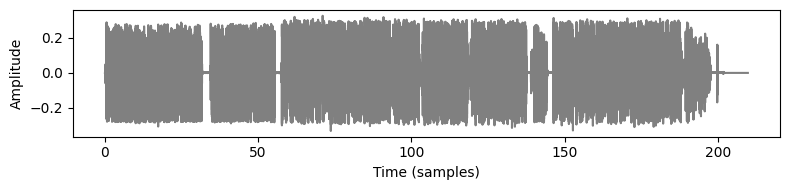

 We start with breaking news. Russian investigators say they have confirmed the identities of the 10 people killed in a plane crash on Wednesday, including the head of the Wagner mercenary group Yavgeni Pugoschen. After forensic testing, Russia's investigative committee said that DNA samples collected at the crash site corresponded to the remains of individuals named on the passenger list. Earlier this week, Russia's civil aviation authority said Pugoschen, along with some of his talks Fs = 16000, x.shape = (480000,), x.dtype = float32


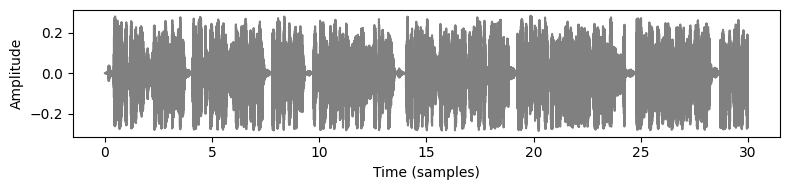

 from the investigative committee said that the DNA tests confirmed the identities of all people on the passenger list without actually mentioning them, or rather of people on the passenger list. So I think that there's still a bit of an ambiguity in the wording of the investigative committee's Fs = 16000, x.shape = (480000,), x.dtype = float32


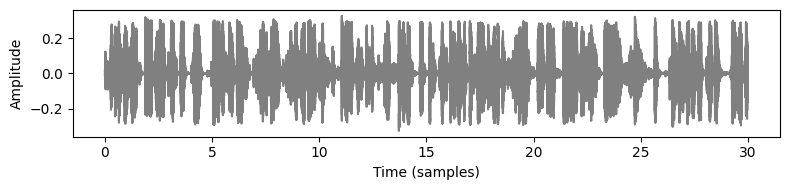

In [12]:
au, au_sr = la.load(audio_file_path)
print_plot_play(au[:int(len(au))], au_sr)
print_plot_play(audios[0], sr, text=transcripts[0])
print_plot_play(audios[2], sr, text=transcripts[2])
